# Data preprocessing for the original CFP dataset


In [ ]:
from IPython.display import clear_output
!cp kaggle.json ~./kaggle
!pip install opendatasets
clear_output()
import opendatasets as od
od.download("https://www.kaggle.com/datasets/asmagamal2/ocular-diseases-asma?select=Eye-diseasesasma")



Please provide your Kaggle credentials to download this dataset. Learn more: http://bit.ly/kaggle-creds
Your Kaggle username: shahadalzhrani
Your Kaggle Key: ··········
Dataset URL: https://www.kaggle.com/datasets/asmagamal2/ocular-diseases-asma


100%|██████████| 2.16G/2.16G [00:21<00:00, 110MB/s]


In [ ]:
!unzip /content/fundus_image_toolbox-main.zip -d /content/fundus_image_toolbox


Archive:  /content/fundus_image_toolbox-main.zip
1a3e16c11be41ef55e0d84b7707cbfc90e82d43d
   creating: /content/fundus_image_toolbox/fundus_image_toolbox-main/
  inflating: /content/fundus_image_toolbox/fundus_image_toolbox-main/.gitignore  
  inflating: /content/fundus_image_toolbox/fundus_image_toolbox-main/LICENSE  
  inflating: /content/fundus_image_toolbox/fundus_image_toolbox-main/MANIFEST.in  
  inflating: /content/fundus_image_toolbox/fundus_image_toolbox-main/Readme.md  
  inflating: /content/fundus_image_toolbox/fundus_image_toolbox-main/fundus1.jpg  
  inflating: /content/fundus_image_toolbox/fundus_image_toolbox-main/fundus2.jpg  
   creating: /content/fundus_image_toolbox/fundus_image_toolbox-main/fundus_circle_crop/
  inflating: /content/fundus_image_toolbox/fundus_image_toolbox-main/fundus_circle_crop/.gitignore  
  inflating: /content/fundus_image_toolbox/fundus_image_toolbox-main/fundus_circle_crop/Readme.md  
   creating: /content/fundus_image_toolbox/fundus_image_too

In [ ]:
import sys
sys.path.append('/content/fundus_image_toolbox/fundus_image_toolbox-main/fundus_utilities/fundus_utilities')
from image_torch_utils import ImageTorchUtils

**CLAHE**

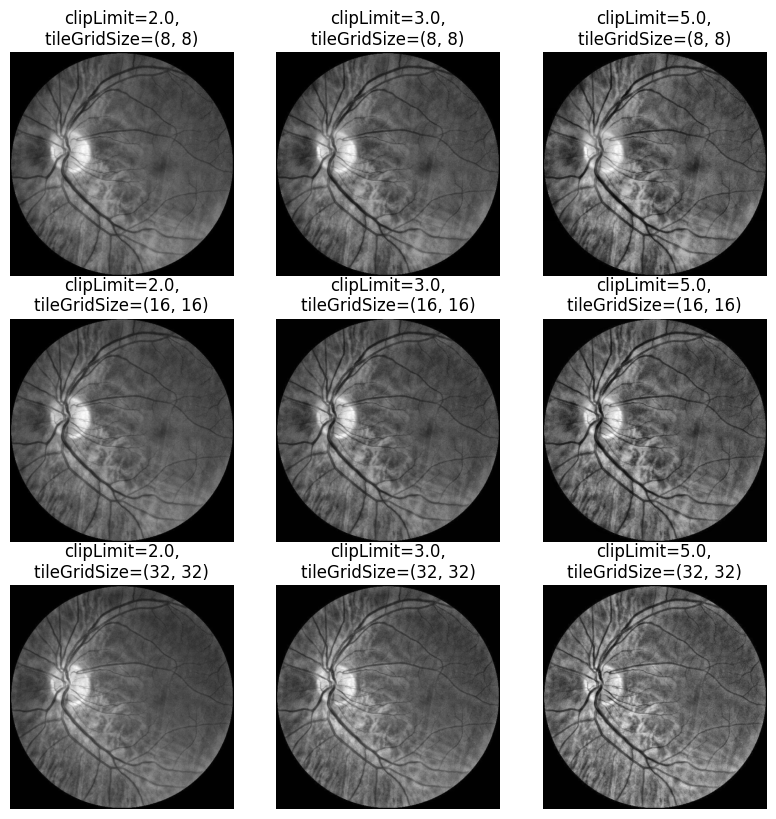

In [ ]:

import sys
import os
import cv2
import matplotlib.pyplot as plt
import numpy as np

sys.path.append('/content/fundus_image_toolbox/fundus_image_toolbox-main/fundus_utilities')

# Load the grayscale image
image_path = "/content/ocular-diseases-asma/Eye-diseasesasma/Normal/Normal (1004).jpg"
if not os.path.exists(image_path):
    raise FileNotFoundError(f"The image path '{image_path}' does not exist.")

image_gray = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

# Ensure the image is uint8
if image_gray.dtype != np.uint8:
    image_gray = (image_gray * 255).astype(np.uint8)

# Define different parameters for CLAHE
clahe_params = [
    {"clipLimit": 2.0, "tileGridSize": (8, 8)},
    {"clipLimit": 3.0, "tileGridSize": (8, 8)},
    {"clipLimit": 5.0, "tileGridSize": (8, 8)},
    {"clipLimit": 2.0, "tileGridSize": (16, 16)},
    {"clipLimit": 3.0, "tileGridSize": (16, 16)},
    {"clipLimit": 5.0, "tileGridSize": (16, 16)},
    {"clipLimit": 2.0, "tileGridSize": (32, 32)},
    {"clipLimit": 3.0, "tileGridSize": (32, 32)},
    {"clipLimit": 5.0, "tileGridSize": (32, 32)},
]

# Apply CLAHE with each parameter set
enhanced_images = []
for params in clahe_params:
    clahe = cv2.createCLAHE(clipLimit=params["clipLimit"], tileGridSize=params["tileGridSize"])
    enhanced_image = clahe.apply(image_gray)
    enhanced_images.append({"params": params, "image": enhanced_image})

# Plot CLAHE-enhanced images in 3 rows
plt.figure(figsize=(8, 8))

for idx, result in enumerate(enhanced_images):
    plt.subplot(3, 3, idx + 1)
    plt.imshow(result["image"], cmap='gray')
    plt.title(f"clipLimit={result['params']['clipLimit']},\ntileGridSize={result['params']['tileGridSize']}")
    plt.axis("off")

plt.tight_layout(pad=0)
plt.show()


**Frangi**

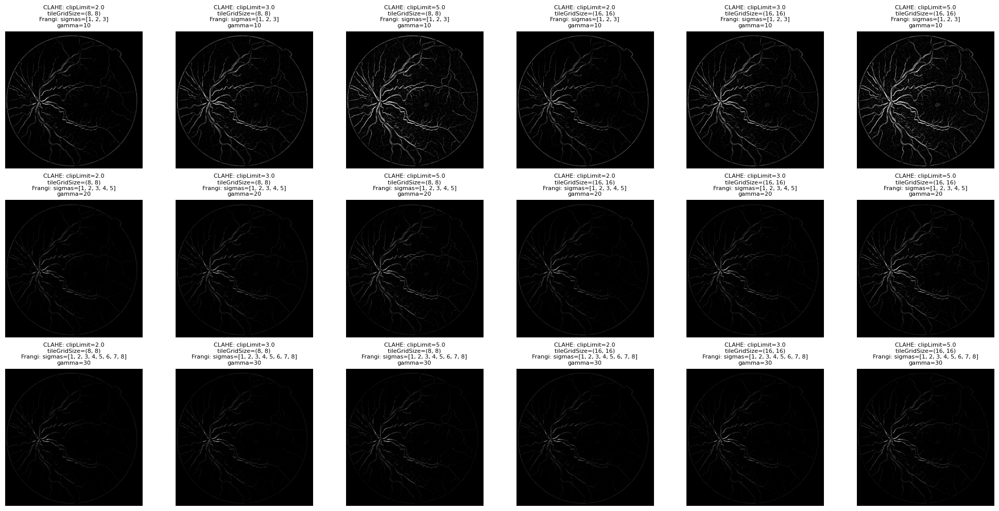

In [ ]:
import matplotlib.pyplot as plt
from skimage.filters import frangi
import cv2
import numpy as np

# Load the grayscale image
image_path = "/content/ocular-diseases-asma/Eye-diseasesasma/diabetic_retinopathy/diabetic_retinopathy (1007).jpg"
image_gray = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

# Ensure the image is uint8
if image_gray.dtype != np.uint8:
    image_gray = (image_gray * 255).astype(np.uint8)

# Define CLAHE parameters
clahe_params = [
    {"clipLimit": 2.0, "tileGridSize": (8, 8)},
    {"clipLimit": 3.0, "tileGridSize": (8, 8)},
    {"clipLimit": 5.0, "tileGridSize": (8, 8)},
    {"clipLimit": 2.0, "tileGridSize": (16, 16)},
    {"clipLimit": 3.0, "tileGridSize": (16, 16)},
    {"clipLimit": 5.0, "tileGridSize": (16, 16)},
]

# Define Frangi parameters
frangi_params = [
    {"sigmas": [1, 2, 3], "gamma": 10},
    {"sigmas": [1, 2, 3, 4, 5], "gamma": 20},
    {"sigmas": [1, 2, 3, 4, 5, 6, 7, 8], "gamma": 30},
]

# Generate images for each combination
images = []
titles = []

for frangi_param in frangi_params:
    for clahe_param in clahe_params:
        # Apply CLAHE
        clahe = cv2.createCLAHE(clipLimit=clahe_param["clipLimit"], tileGridSize=clahe_param["tileGridSize"])
        clahe_image = clahe.apply(image_gray)

        # Apply Frangi filter
        frangi_image = frangi(
            clahe_image,
            sigmas=frangi_param["sigmas"],
            alpha=0.5,
            beta=0.5,
            gamma=frangi_param["gamma"],
        )

        # Store image and title
        images.append(frangi_image)
        titles.append(
            f"CLAHE: clipLimit={clahe_param['clipLimit']}\n"
            f"tileGridSize={clahe_param['tileGridSize']}\n"
            f"Frangi: sigmas={frangi_param['sigmas']}\n"
            f"gamma={frangi_param['gamma']}"
        )

# Plot images in a grid
rows = len(frangi_params)
cols = len(clahe_params)
fig, axes = plt.subplots(rows, cols, figsize=(20, 10))

for i, ax in enumerate(axes.flat):
    ax.imshow(images[i], cmap="gray")
    ax.set_title(titles[i], fontsize=8)
    ax.axis("off")

plt.tight_layout()
plt.show()


**CLAHE + Histogram Equalization**

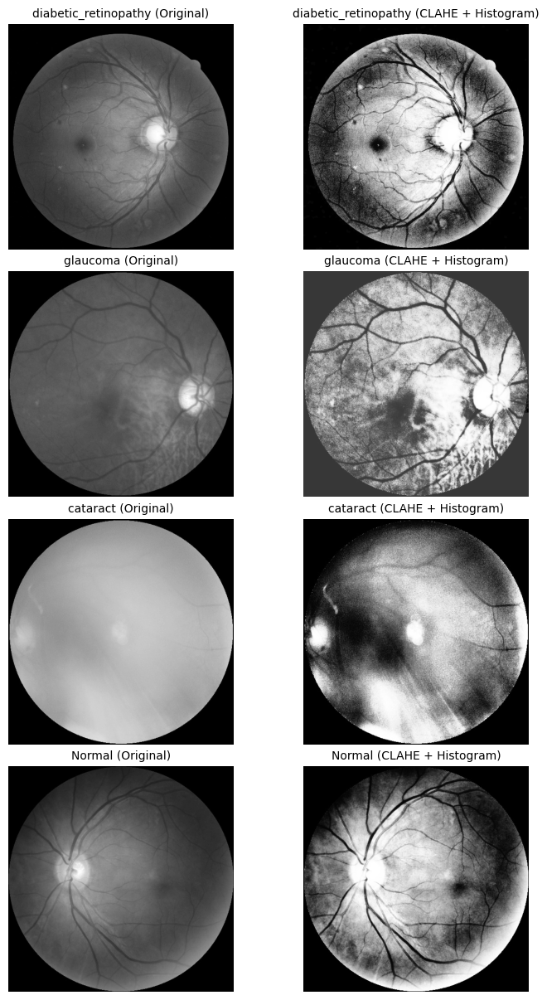

In [ ]:
import cv2
import matplotlib.pyplot as plt

# Define the paths
image_paths = {
    "diabetic_retinopathy": "/content/ocular-diseases-asma/Eye-diseasesasma/diabetic_retinopathy/diabetic_retinopathy (378).jpg",
    "glaucoma": "/content/ocular-diseases-asma/Eye-diseasesasma/glaucoma/glaucoma (151).jpg",
    "cataract": "/content/ocular-diseases-asma/Eye-diseasesasma/cataract/cataract (19).jpg",
    "Normal": "/content/ocular-diseases-asma/Eye-diseasesasma/Normal/Normal (2).jpg",
}

# CLAHE + Histogram parameters
def apply_clahe_histogram(image, clipLimit=2.0, tileGridSize=(8, 8)):
    clahe = cv2.createCLAHE(clipLimit=clipLimit, tileGridSize=tileGridSize)
    clahe_image = clahe.apply(image)
    return cv2.equalizeHist(clahe_image)

# Initialize storage for results
results = []

# Process each specified image
for category, image_path in image_paths.items():
    # Load the image in grayscale
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    if image is None:
        print(f"Failed to load image: {image_path}")
        continue

    # Apply CLAHE + Histogram Equalization
    clahe_hist_image = apply_clahe_histogram(image)

    # Store results for display
    results.append({
        "category": category,
        "original": image,
        "processed": clahe_hist_image
    })

# Plot images using the preferred technique
plt.figure(figsize=(8, 12))

for idx, result in enumerate(results):
    # Original image
    plt.subplot(len(results), 2, idx * 2 + 1)
    plt.imshow(result["original"], cmap='gray')
    plt.title(f"{result['category']} (Original)", fontsize=10)
    plt.axis("off")

    # Processed image
    plt.subplot(len(results), 2, idx * 2 + 2)
    plt.imshow(result["processed"], cmap='gray')
    plt.title(f"{result['category']} (CLAHE + Histogram)", fontsize=10)
    plt.axis("off")

plt.tight_layout(pad=0.5)
plt.show()



Representaion

Processing disease: Normal


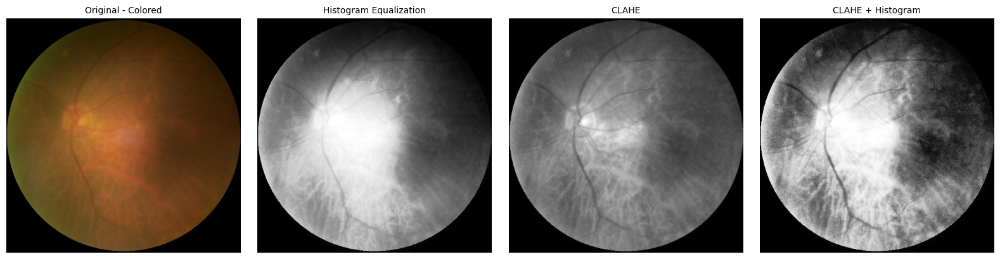

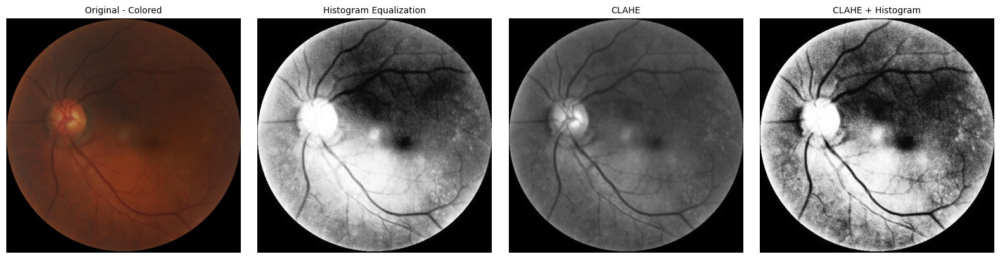

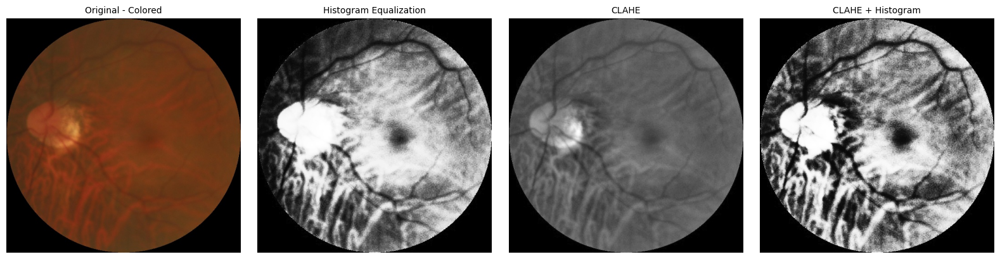

Processing disease: cataract


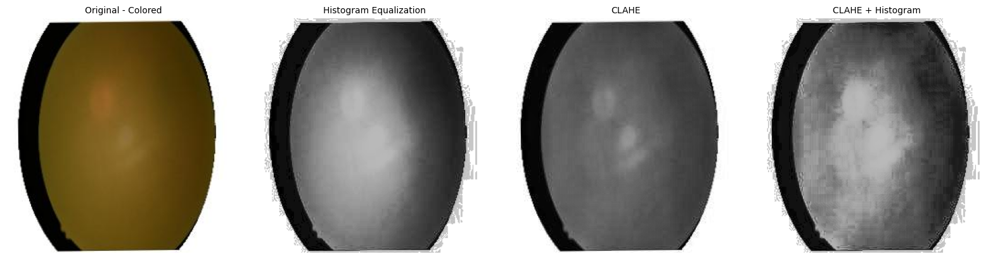

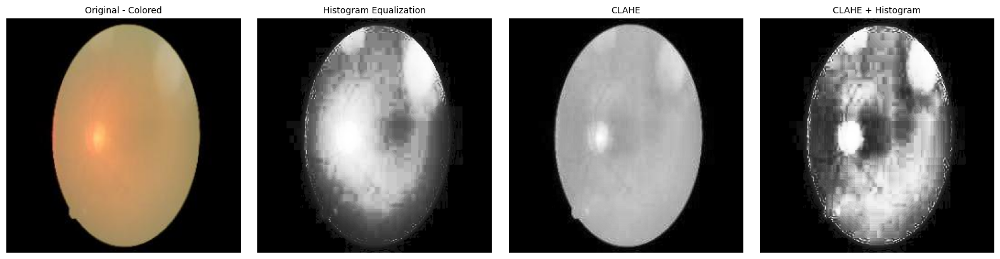

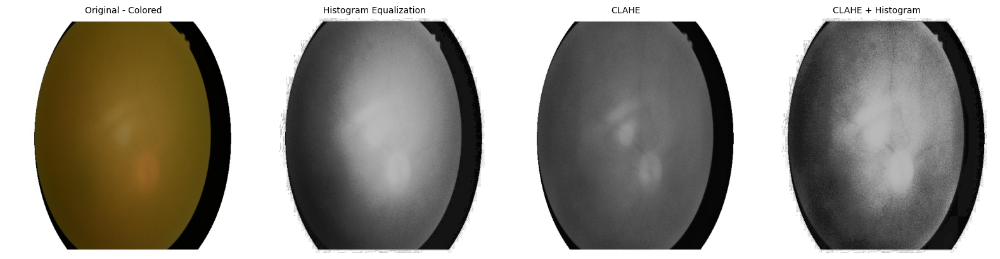

Processing disease: diabetic_retinopathy


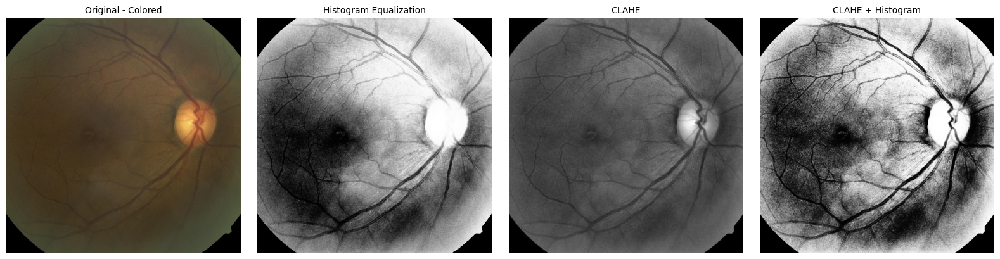

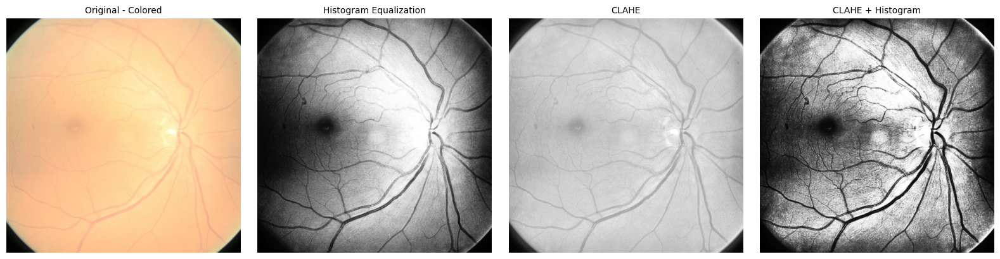

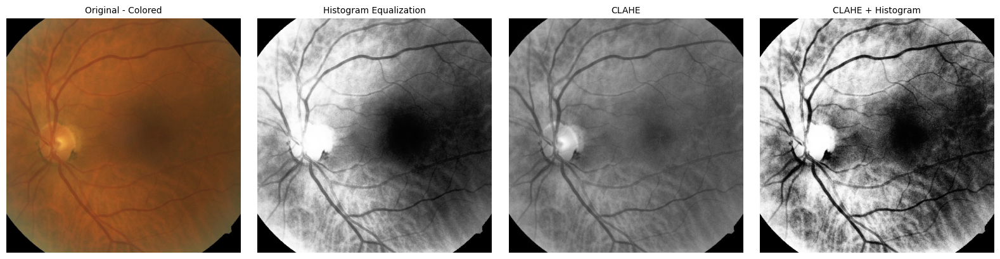

Processing disease: glaucoma


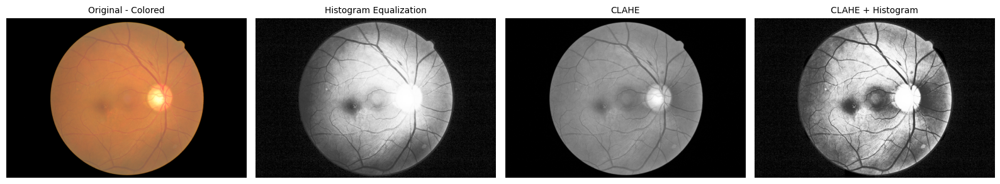

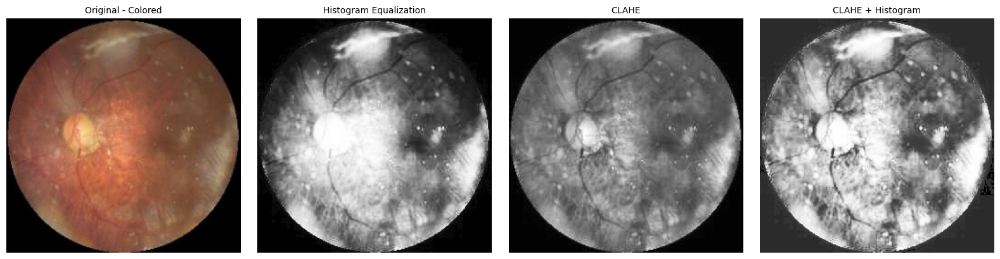

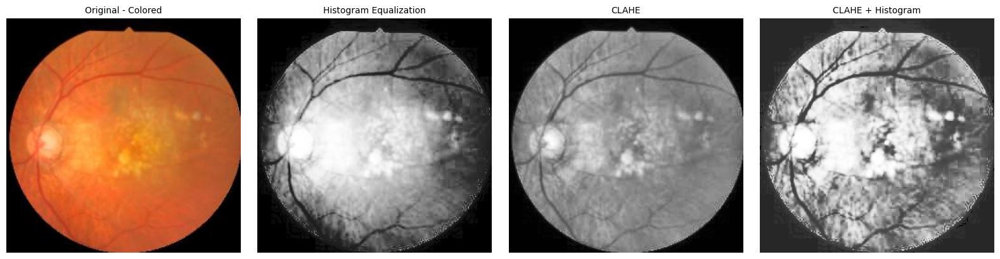

In [ ]:
# Function to display the first 4 images in a row
def display_first_4_columns(images, titles):
    plt.figure(figsize=(16, 4))
    for i, (img, title) in enumerate(zip(images[:4], titles[:4])):  # Select the first 4 columns
        plt.subplot(1, 4, i + 1)
        plt.imshow(img, cmap="gray" if len(img.shape) == 2 else None)
        plt.title(title, fontsize=10)
        plt.axis("off")
    plt.tight_layout()
    plt.show()

# Process each disease category for the first 4 columns
for disease in diseases:
    disease_path = os.path.join(data_path, disease)
    images = [os.path.join(disease_path, img) for img in os.listdir(disease_path) if img.endswith(('.png', '.jpg', '.jpeg'))][:num_images]

    print(f"Processing disease: {disease}")

    for img_path in images:
        # Load the original image
        original_image = cv2.imread(img_path)
        original_image_rgb = cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB)

        # Ensure the image data type is uint8
        original_gray = cv2.cvtColor(original_image, cv2.COLOR_BGR2GRAY)
        if original_gray.dtype != np.uint8:
            original_gray = (255 * (original_gray / np.max(original_gray))).astype(np.uint8)

        # Apply image enhancements
        image_clahe = apply_clahe(original_gray)
        image_histogram = apply_histogram_equalization(original_gray)
        image_clahe_histogram = apply_clahe_histogram(original_gray)

        # Organize images and titles for the first 4 columns
        images_row_first_4 = [
            original_image_rgb,  # Original colored image (RGB)
            image_histogram,  # After Histogram Equalization
            image_clahe,  # After CLAHE
            image_clahe_histogram,  # After CLAHE + Histogram Equalization
        ]
        titles_row_first_4 = [
            "Original - Colored",
            "Histogram Equalization",
            "CLAHE",
            "CLAHE + Histogram",
        ]

        # Display the first 4 columns
        display_first_4_columns(images_row_first_4, titles_row_first_4)


# Save the preprocessed data

**1- clahe**

In [ ]:
import os
import cv2

# Define the path to your dataset
data_path = "/content/ocular-diseases-asma/Eye-diseasesasma"

# CLAHE parameters
def apply_clahe(image, clipLimit=2.0, tileGridSize=(8, 8)):
    clahe = cv2.createCLAHE(clipLimit=clipLimit, tileGridSize=tileGridSize)
    return clahe.apply(image)

# Path to save the CLAHE-processed dataset
output_clahe = "/content/preprocessed_clahe"
os.makedirs(output_clahe, exist_ok=True)

# Process each category in the dataset
for category in os.listdir(data_path):
    category_path = os.path.join(data_path, category)
    output_category_path = os.path.join(output_clahe, category)
    os.makedirs(output_category_path, exist_ok=True)

    for img_name in os.listdir(category_path):
        img_path = os.path.join(category_path, img_name)
        image = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)

        if image is None:
            print(f"Failed to read image: {img_path}")
            continue

        # Apply CLAHE only
        clahe_image = apply_clahe(image)

        # Save the processed image
        cv2.imwrite(os.path.join(output_category_path, img_name), clahe_image)

print("CLAHE preprocessed dataset saved.")


CLAHE preprocessed dataset saved.


In [ ]:
import shutil

# Path of the preprocessed CLAHE dataset
output_clahe = "/content/preprocessed_clahe"

# Path to save the compressed file
zip_path_clahe = "/content/preprocessed_clahe.zip"

# Compress the folder
shutil.make_archive(output_clahe, 'zip', output_clahe)

print(f"Compressed CLAHE dataset saved at: {zip_path_clahe}")


Compressed CLAHE dataset saved at: /content/preprocessed_clahe.zip


In [ ]:
from google.colab import files

# Download the CLAHE ZIP file
files.download("/content/preprocessed_clahe.zip")


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

**CLAHE + Histogram Equalization**

In [ ]:
import os
import cv2

# Define the path to your dataset
data_path = "/content/ocular-diseases-asma/Eye-diseasesasma"

# CLAHE + Histogram parameters
def apply_clahe_histogram(image, clipLimit=2.0, tileGridSize=(8, 8)):
    clahe = cv2.createCLAHE(clipLimit=clipLimit, tileGridSize=tileGridSize)
    clahe_image = clahe.apply(image)
    return cv2.equalizeHist(clahe_image)

# Path to save the CLAHE + Histogram processed dataset
output_clahe_histogram = "/content/preprocessed_clahe_histogram"
os.makedirs(output_clahe_histogram, exist_ok=True)

# Process each category in the dataset
for category in os.listdir(data_path):
    category_path = os.path.join(data_path, category)
    output_category_path = os.path.join(output_clahe_histogram, category)
    os.makedirs(output_category_path, exist_ok=True)

    for img_name in os.listdir(category_path):
        img_path = os.path.join(category_path, img_name)
        image = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)

        if image is None:
            print(f"Failed to read image: {img_path}")
            continue

        # Apply CLAHE + Histogram Equalization
        processed_image = apply_clahe_histogram(image)

        # Save the processed image
        cv2.imwrite(os.path.join(output_category_path, img_name), processed_image)

print("CLAHE + Histogram preprocessed dataset saved.")


CLAHE + Histogram preprocessed dataset saved.


In [ ]:
import shutil

# Path of the preprocessed CLAHE + Histogram dataset
output_clahe_histogram = "/content/preprocessed_clahe_histogram"

# Path to save the compressed file
zip_path_clahe_histogram = "/content/preprocessed_clahe_histogram.zip"

# Compress the folder
shutil.make_archive(output_clahe_histogram, 'zip', output_clahe_histogram)

print(f"Compressed CLAHE + Histogram dataset saved at: {zip_path_clahe_histogram}")


Compressed CLAHE + Histogram dataset saved at: /content/preprocessed_clahe_histogram.zip


In [ ]:
from google.colab import files

# Download the CLAHE + Histogram ZIP file
files.download("/content/preprocessed_clahe_histogram.zip")


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

**3- CLAHE + Frangi (5,8)**

In [ ]:
import os
import cv2
import numpy as np
from skimage.filters import frangi
from multiprocessing import Pool

# Define the path to your dataset
data_path = "/content/ocular-diseases-asma/Eye-diseasesasma"

# CLAHE + Frangi parameters
def apply_clahe_frangi(image, clipLimit=5.0, tileGridSize=(8, 8), sigmas=[1, 2, 3], gamma=10):
    """
    Apply CLAHE followed by the Frangi filter.
    """
    try:
        # Apply CLAHE
        clahe = cv2.createCLAHE(clipLimit=clipLimit, tileGridSize=tileGridSize)
        clahe_image = clahe.apply(image)
        # Apply Frangi filter
        frangi_image = frangi(clahe_image, sigmas=sigmas, gamma=gamma)
        return (clahe_image, (frangi_image * 255).astype(np.uint8))
    except Exception as e:
        print(f"Error applying CLAHE + Frangi: {e}")
        return None, None

# Output path for processed images
output_frangi_clahe = "/content/preprocessed_frangi_clahe"
os.makedirs(output_frangi_clahe, exist_ok=True)

def process_image(img_path_and_category):
    """
    Process a single image: apply CLAHE and Frangi, then save the outputs.
    """
    try:
        img_path, output_category_path = img_path_and_category
        image = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)

        if image is None:
            print(f"Failed to read image: {img_path}")
            return

        # Apply CLAHE + Frangi
        clahe_image, frangi_image = apply_clahe_frangi(image)

        # Check if processing succeeded
        if clahe_image is None or frangi_image is None:
            print(f"Processing failed for image: {img_path}")
            return

        # Save both CLAHE and Frangi processed images
        img_name = os.path.basename(img_path)
        cv2.imwrite(os.path.join(output_category_path, f"CLAHE_{img_name}"), clahe_image)
        cv2.imwrite(os.path.join(output_category_path, f"Frangi_{img_name}"), frangi_image)
        print(f"Processed: {img_path}")
    except Exception as e:
        print(f"Error processing image {img_path}: {e}")

# Prepare a list of all image paths and their corresponding output paths
image_paths = []
for category in os.listdir(data_path):
    category_path = os.path.join(data_path, category)
    if not os.path.isdir(category_path):
        print(f"Skipping non-directory: {category_path}")
        continue

    output_category_path = os.path.join(output_frangi_clahe, category)
    os.makedirs(output_category_path, exist_ok=True)

    for img_name in os.listdir(category_path):
        if img_name.lower().endswith(('.png', '.jpg', '.jpeg')):
            img_path = os.path.join(category_path, img_name)
            image_paths.append((img_path, output_category_path))

# Use multiprocessing to process images in parallel
try:
    with Pool(processes=4) as pool:
        pool.map(process_image, image_paths)
    print("CLAHE + Frangi preprocessed dataset saved.")
except Exception as e:
    print(f"Error during multiprocessing: {e}")


Streaming output truncated to the last 5000 lines.
Processed: /content/ocular-diseases-asma/Eye-diseasesasma/glaucoma/glaucoma (2828).jpg
Processed: /content/ocular-diseases-asma/Eye-diseasesasma/glaucoma/glaucoma (876).jpg
Processed: /content/ocular-diseases-asma/Eye-diseasesasma/glaucoma/glaucoma (3002).jpg
Processed: /content/ocular-diseases-asma/Eye-diseasesasma/glaucoma/glaucoma (707).jpg
Processed: /content/ocular-diseases-asma/Eye-diseasesasma/glaucoma/glaucoma (85).jpg
Processed: /content/ocular-diseases-asma/Eye-diseasesasma/glaucoma/glaucoma (925).jpg
Processed: /content/ocular-diseases-asma/Eye-diseasesasma/glaucoma/glaucoma (631).jpg
Processed: /content/ocular-diseases-asma/Eye-diseasesasma/glaucoma/glaucoma (1680).jpg
Processed: /content/ocular-diseases-asma/Eye-diseasesasma/glaucoma/glaucoma (2096).jpg
Processed: /content/ocular-diseases-asma/Eye-diseasesasma/glaucoma/glaucoma (1764).jpg
Processed: /content/ocular-diseases-asma/Eye-diseasesasma/glaucoma/glaucoma (323).jpg

In [ ]:
import shutil

# Path of the preprocessed CLAHE + Frangi dataset
output_frangi_clahe = "/content/preprocessed_frangi_clahe"

# Path to save the compressed file
zip_path_frangi_clahe = "/content/preprocessed_frangi_clahe.zip"

# Compress the folder
shutil.make_archive(output_frangi_clahe, 'zip', output_frangi_clahe)

print(f"Compressed CLAHE + Frangi dataset saved at: {zip_path_frangi_clahe}")


Compressed CLAHE + Frangi dataset saved at: /content/preprocessed_frangi_clahe.zip


In [ ]:
from google.colab import files

# Download the CLAHE + Frangi ZIP file
files.download("/content/preprocessed_frangi_clahe.zip")


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>